# Displaying data

In [268]:
%matplotlib inline

# Import dependencies
import h5py
import numpy as np
from matplotlib import pyplot as plt
import fastmri
from fastmri.data import transforms as T

In [269]:
# Define paths to image
original_image_path = "/home/dbertic/Documents/Faks/OSIRV/data/multicoil_test/file_brain_AXT2_210_6001798.h5"
image_base_dir = "."
image_name = "file_brain_AXT2_210_6001798.h5"

In [270]:
# Define which slice we look for easier comparison
mri_slice = 6
# mri_slice = 9

## Original image

We'll import fully sampled image, display it, generate some noise on it and run it through our models.

In [271]:
hf = h5py.File(original_image_path)

In [272]:
print('Keys:', list(hf.keys()))
print('Attrs:', dict(hf.attrs))

Keys: ['ismrmrd_header', 'kspace', 'mask']
Attrs: {'acceleration': 4, 'acquisition': 'AXT2', 'num_low_frequency': 32, 'patient_id': '3ca892525751dbed8b2f5eb7a1e27bd6465d455dcd6f49b602ad3eaf71cf4791'}


In multi-coil MRIs, k-space has the following shape:
(number of slices, number of coils, height, width)

For single-coil MRIs, k-space has the following shape:
(number of slices, height, width)

MRIs are acquired as 3D volumes, the first dimension is the number of 2D slices.

In [273]:
volume_kspace = hf['kspace'][()]
print(volume_kspace.dtype)
print(volume_kspace.shape)

complex64
(16, 20, 768, 396)


In [274]:
slice_kspace = volume_kspace[mri_slice] # Choosing the 15-th slice of this volume

Let's see what the absolute value of k-space looks like:

In [275]:
def show_coils(data, slice_nums, cmap='gray', name="image.png"):
    fig = plt.figure()
    for i, num in enumerate(slice_nums):
        plt.subplot(1, len(slice_nums), i + 1)
        plt.imshow(data[num], cmap=cmap)
        plt.axis('off')
        fig.tight_layout()
    plt.savefig("test_data_" + name)

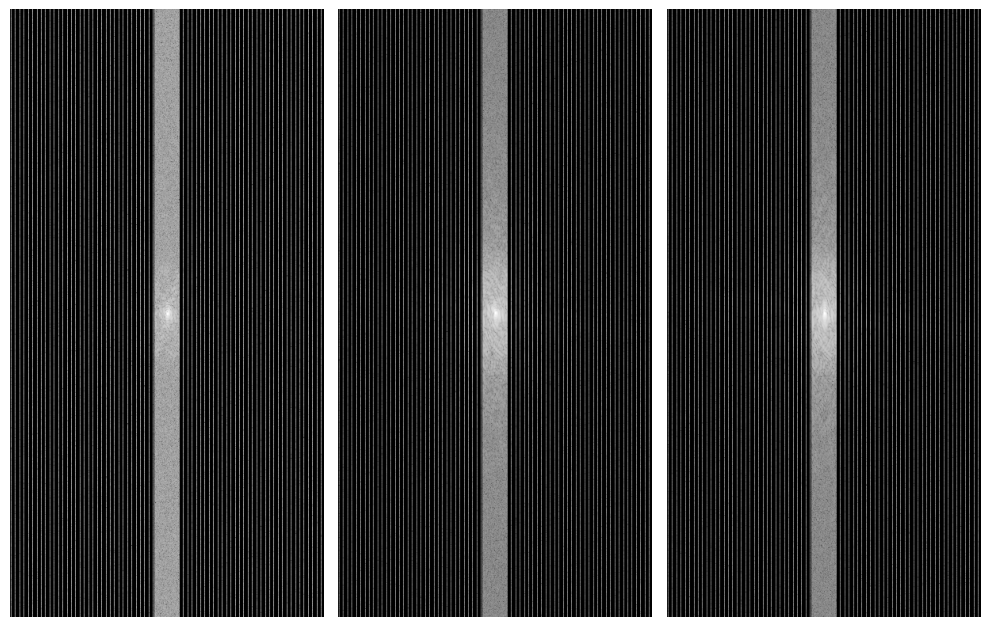

In [276]:
show_coils(np.log(np.abs(slice_kspace) + 1e-9), [0, 2, 3],  name="val_kspace.png")  # This shows coils 0, 5 and 10

The fastMRI repo contains some utlity functions to convert k-space into image space. These functions work on PyTorch Tensors. The to_tensor function can convert Numpy arrays to PyTorch Tensors.

In [277]:
slice_kspace2 = T.to_tensor(slice_kspace)      # Convert from numpy array to pytorch tensor
slice_image = fastmri.ifft2c(slice_kspace2)           # Apply Inverse Fourier Transform to get the complex image
slice_image_abs = fastmri.complex_abs(slice_image)   # Compute absolute value to get a real image

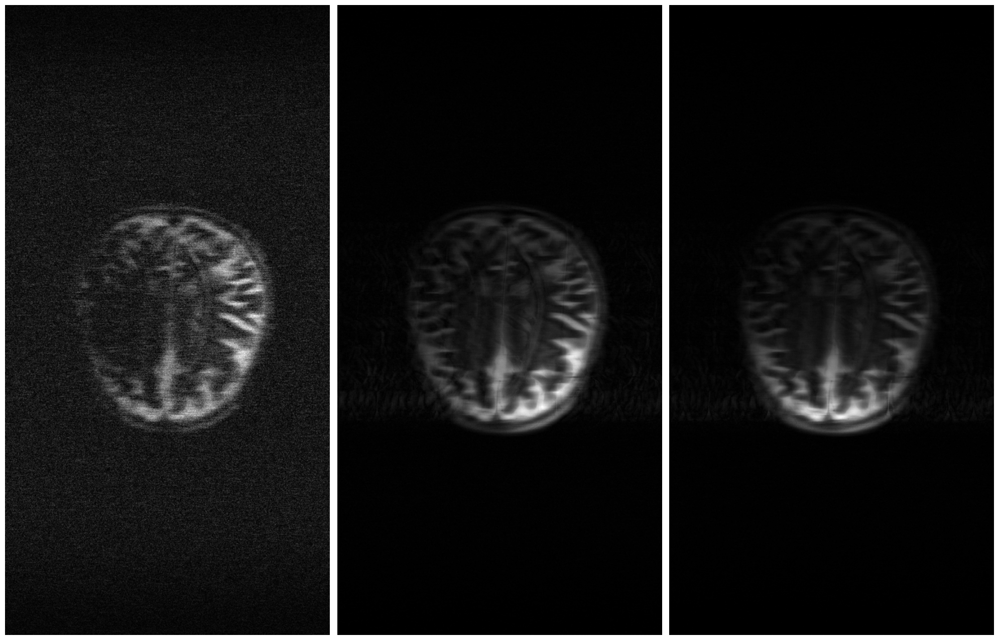

In [278]:
plt.rcParams['figure.figsize'] = [20, 16] # enlarge inline plots

show_coils(slice_image_abs, [0, 2, 3], cmap='gray', name="val_coils.png")

As we can see, each coil in a multi-coil MRI scan focusses on a different region of the image. These coils can be combined into the full image using the Root-Sum-of-Squares (RSS) transform.

In [279]:
slice_image_rss = fastmri.rss(slice_image_abs, dim=0)

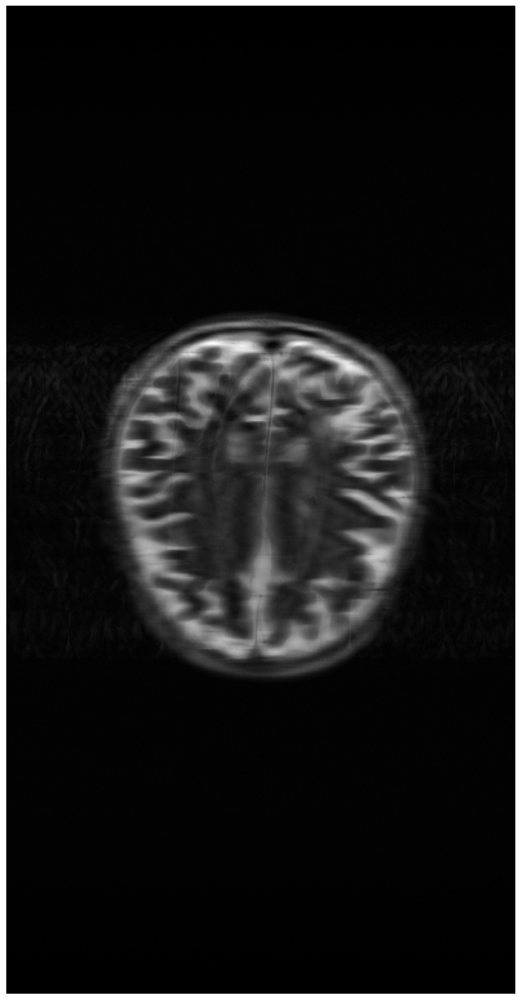

In [280]:
plt.axis('off')
plt.imshow(np.abs(slice_image_rss.numpy()), cmap='gray')
plt.tight_layout()
plt.savefig("val_slice_mc_combined.png")

So far, we have been looking at fully-sampled data. We can simulate under-sampled data by creating a mask and applying it to k-space.

In [281]:
hf = h5py.File("/home/dbertic/Documents/Faks/OSIRV/data/reconstructed/cs/" + image_name)
# hf = h5py.File("/media/drazen/Transcend/MRI/multicoil_temp/file_brain_AXFLAIR_200_6002564.h5")

print('Keys: ', list(hf.keys()))
print('Keys: ', dict(hf.attrs))

Keys:  ['reconstruction']
Keys:  {}


Showing kspace parameters.

In [282]:
volume_kspace = hf['reconstruction'][()]
print(volume_kspace.dtype)
print(volume_kspace.shape)

float32
(16, 384, 384)


First parameter represents number of slices.

Choosing the 10-th slice of this volume

In [283]:
slice_kspace = volume_kspace[mri_slice]
print(slice_kspace.shape)

(384, 384)


Absolute value of k-space

In [284]:
# show_coils(np.log(np.abs(slice_kspace) + 1e-9), [0, 5, 10], cmap='gray', name='val_coil_compressed_kspace.png')  # This shows coils 0, 5 and 10

The fastMRI repo contains some utlity functions to convert k-space into image space. These functions work on PyTorch Tensors. The to_tensor function can convert Numpy arrays to PyTorch Tensors.

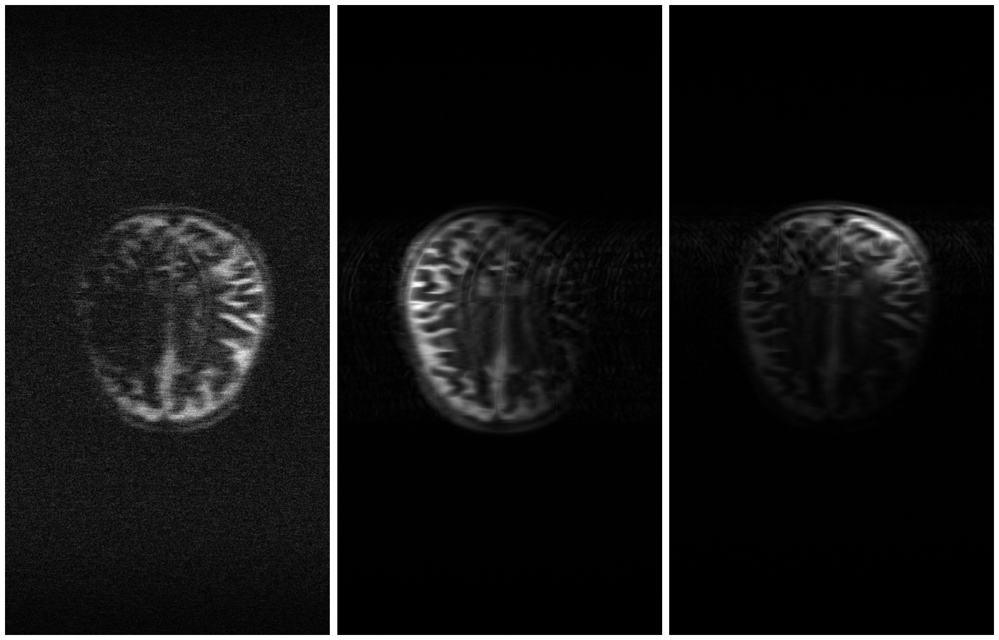

In [285]:
plt.rcParams['figure.figsize'] = [20, 16] # enlarge inline plots

show_coils(slice_image_abs, [0, 5, 10], cmap='gray', name='val_coil_compressed_image.png')

As we can see, each coil in a multi-coil MRI scan focusses on a different region of the image. These coils can be combined into the full image using the Root-Sum-of-Squares (RSS) transform.

In [286]:
slice_image_rss = fastmri.rss(slice_image_abs, dim=0)

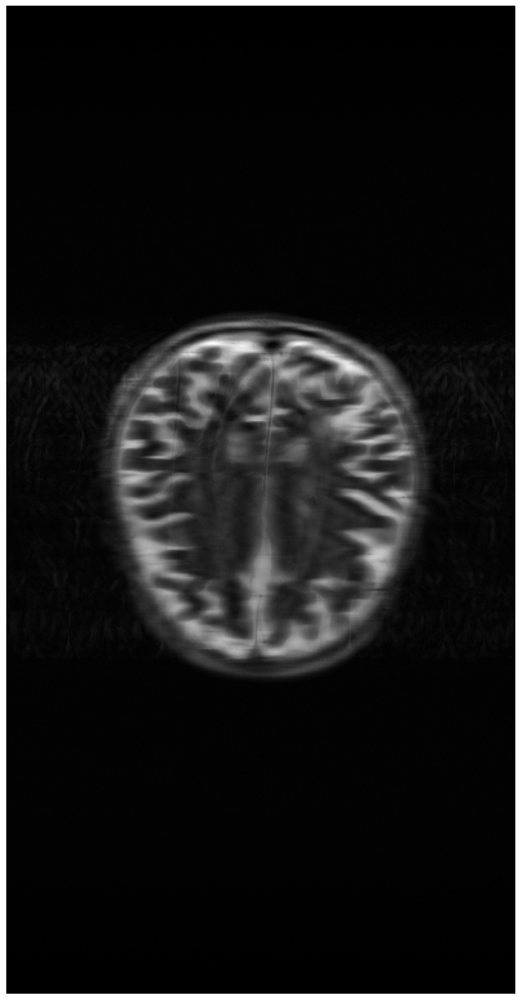

In [287]:
plt.axis('off')
plt.tight_layout()
plt.imshow(np.abs(slice_image_rss.numpy()), cmap='gray')

## Functions

In [288]:
def show_slices(data, num_slices, cmap=None, name="image.png"):
    fig = plt.figure()
    for i in range(0, num_slices):
        plt.subplot(3, 5, i + 1)
        plt.imshow(data[i], cmap=cmap)
        plt.axis('off')
        # plt.tight_layout()
    plt.savefig(name)

## Zero-Filled

In [289]:
hf = h5py.File("/home/dbertic/Documents/Faks/OSIRV/data/reconstructed/zero-filled/" + image_name)

In [290]:
print('Keys:', list(hf.keys()))
print('Attrs:', dict(hf.attrs))

Keys: ['reconstruction']
Attrs: {}


We don't have `kspace` key anymore, now we have to use `reconstruction` key.

`Reconstruction` volume has the following shape: (number of slices, height, width).

In [291]:
zf_volume_reconstruction = hf['reconstruction'][()]
print(zf_volume_reconstruction.dtype)
print(zf_volume_reconstruction.shape)

float32
(16, 768, 396)


In [292]:
zf_slice_reconstruction = zf_volume_reconstruction[mri_slice] # Choosing slice
print(zf_slice_reconstruction.shape)

(768, 396)


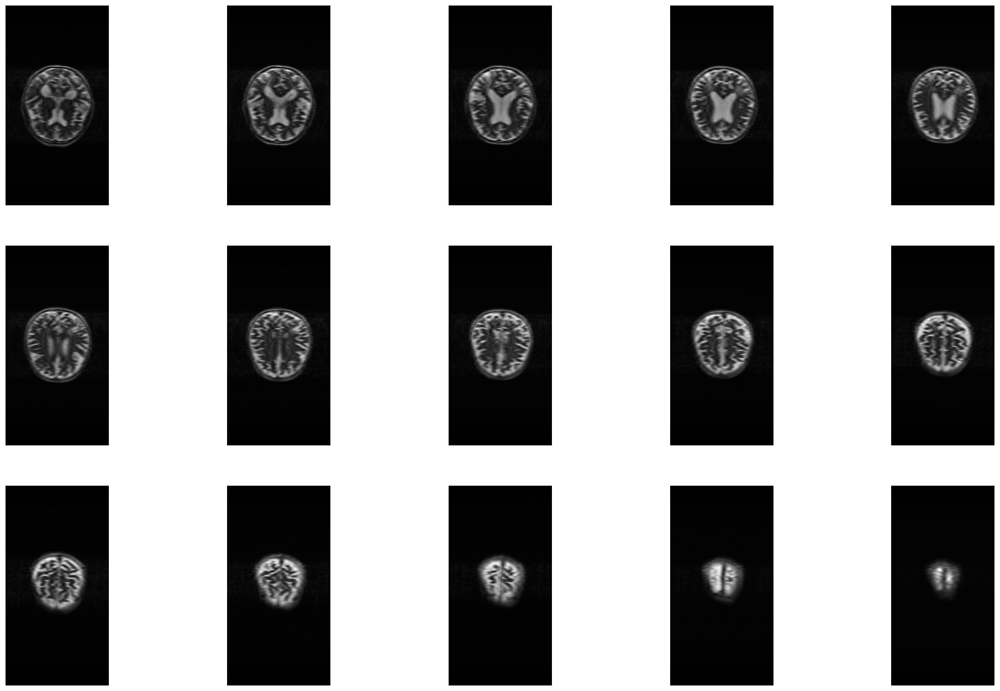

In [293]:
plt.rcParams['figure.figsize'] = [25, 16] # enlarge inline plots

show_slices(zf_volume_reconstruction, 15, cmap='gray', name="val_compressed_all_slices_zf.png")

# fig = plt.figure()
# plt.imshow(slice_reconstruction, cmap='gray')

Let's show 10th slice.

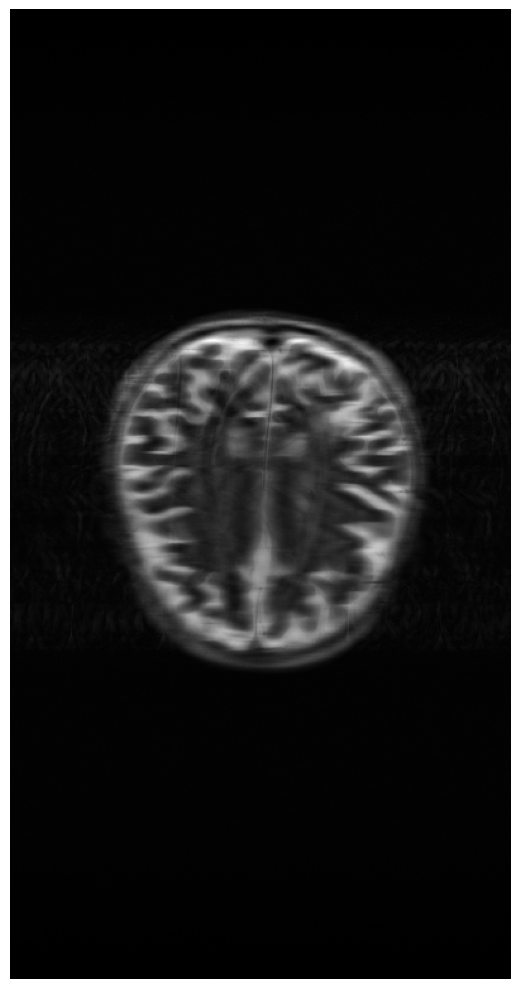

In [294]:
plt.rcParams['figure.figsize'] = [10, 10]
plt.imshow(zf_slice_reconstruction, cmap='gray')
plt.axis('off')
plt.tight_layout()
plt.savefig("val_compressed_full_zf.png")

## Compressed Sensing

In [295]:
hf = h5py.File("/home/dbertic/Documents/Faks/OSIRV/data/reconstructed/cs/" + image_name)

In [296]:
print('Keys:', list(hf.keys()))
print('Attrs:', dict(hf.attrs))

Keys: ['reconstruction']
Attrs: {}


We don't have `kspace` key anymore, now we have to use `reconstruction` key.

`Reconstruction` volume has the following shape: (number of slices, height, width).

In [297]:
cs_volume_reconstruction = hf['reconstruction'][()]
print(cs_volume_reconstruction.dtype)
print(cs_volume_reconstruction.shape)

float32
(16, 384, 384)


In [298]:
cs_slice_reconstruction = cs_volume_reconstruction[mri_slice] # Choosing slice
print(cs_slice_reconstruction.shape)

(384, 384)


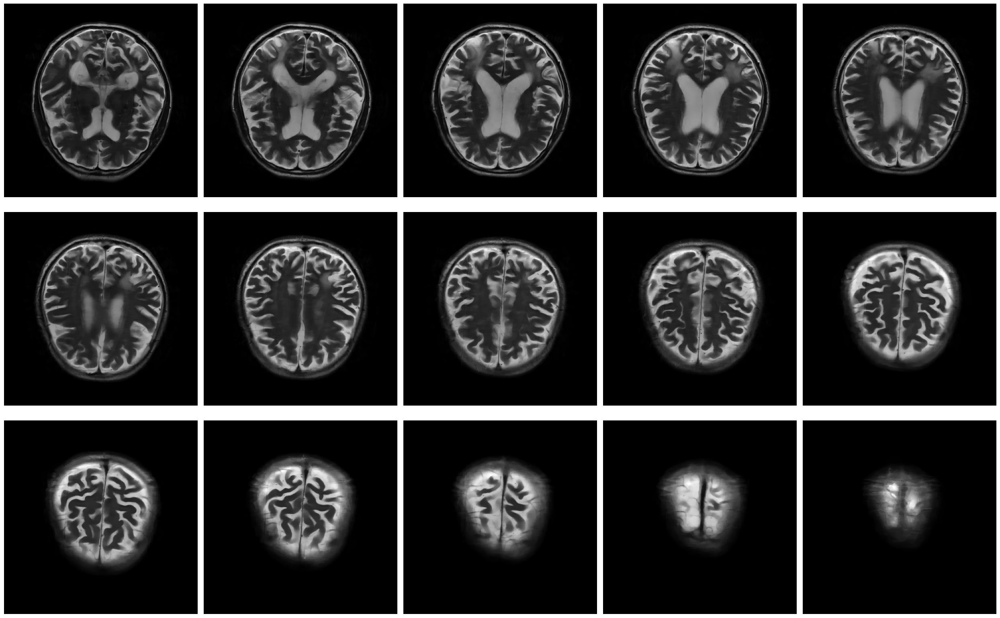

In [299]:
plt.rcParams['figure.figsize'] = [25, 16] # enlarge inline plots

show_slices(cs_volume_reconstruction, 15, cmap='gray')

# fig = plt.figure()
plt.axis('off')
plt.tight_layout()
# plt.imshow(slice_reconstruction, cmap='gray')

Let's show 10th slice.

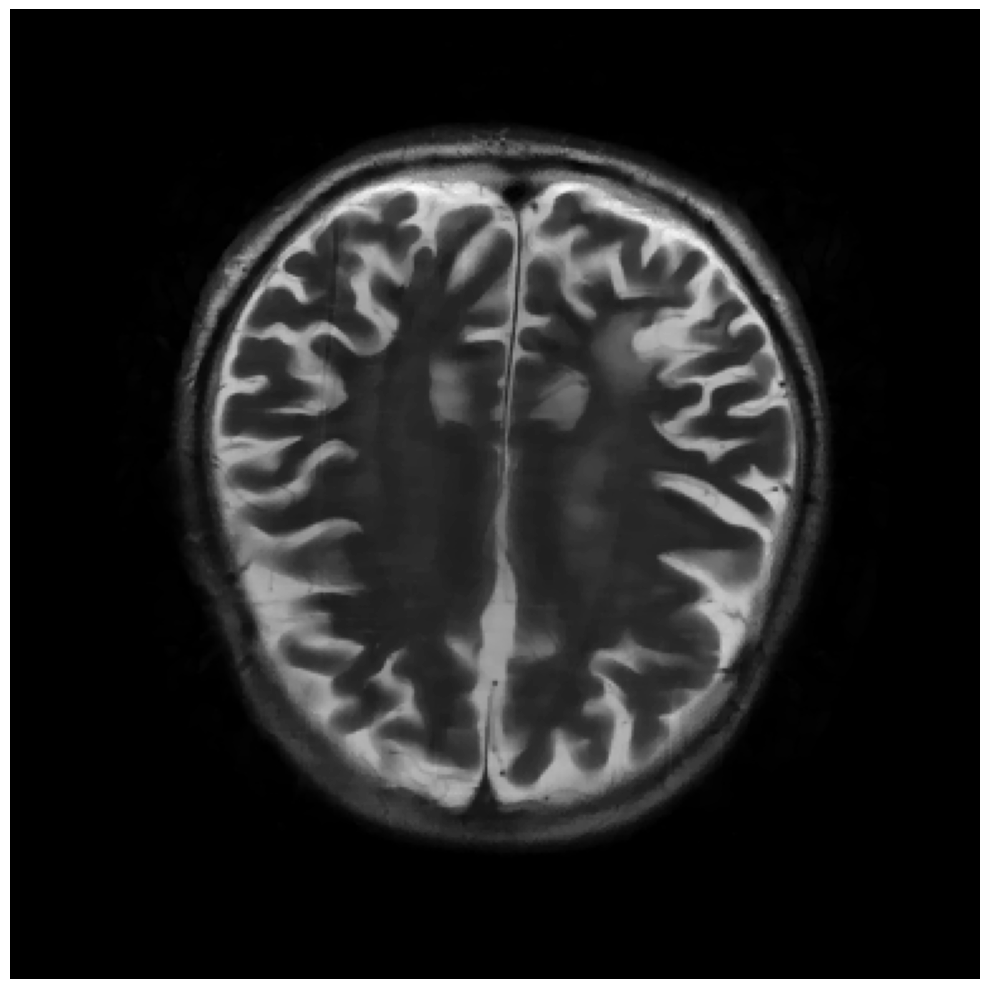

In [300]:
plt.rcParams['figure.figsize'] = [10, 10]
plt.axis('off')
plt.tight_layout()
plt.imshow(cs_slice_reconstruction, cmap='gray')
plt.savefig("cs_slice_reconstruction.png")

## Varnet

In [301]:
hf = h5py.File("/home/dbertic/Documents/Faks/OSIRV/data/reconstructed/varnet/reconstructions/" + image_name)

In [302]:
print('Keys:', list(hf.keys()))
print('Attrs:', dict(hf.attrs))

Keys: ['reconstruction']
Attrs: {}


We don't have `kspace` key anymore, now we have to use `reconstruction` key.

`Reconstruction` volume has the following shape: (number of slices, height, width).

In [303]:
varnet_volume_reconstruction = hf['reconstruction'][()]
print(varnet_volume_reconstruction.dtype)
print(varnet_volume_reconstruction.shape)

float32
(16, 384, 384)


In [304]:
varnet_slice_reconstruction = varnet_volume_reconstruction[mri_slice] # Choosing slice
print(varnet_slice_reconstruction.shape)

(384, 384)


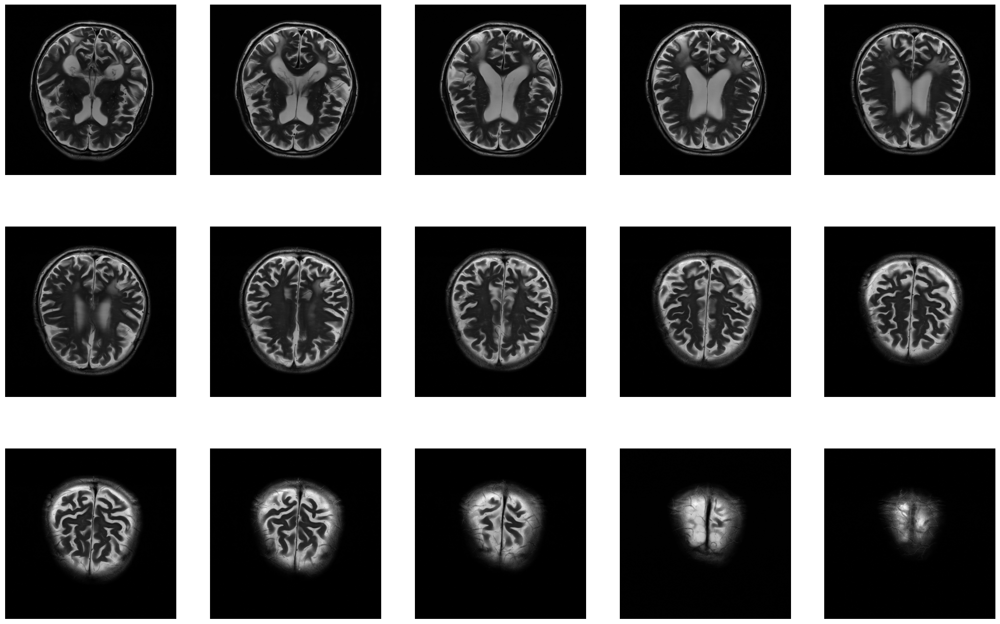

In [305]:
plt.rcParams['figure.figsize'] = [25, 16] # enlarge inline plots

show_slices(varnet_volume_reconstruction, 15, cmap='gray', name="varnet_reconstructed_all_slices.png")

# fig = plt.figure()
# plt.imshow(slice_reconstruction, cmap='gray')

Let's show 10th slice.

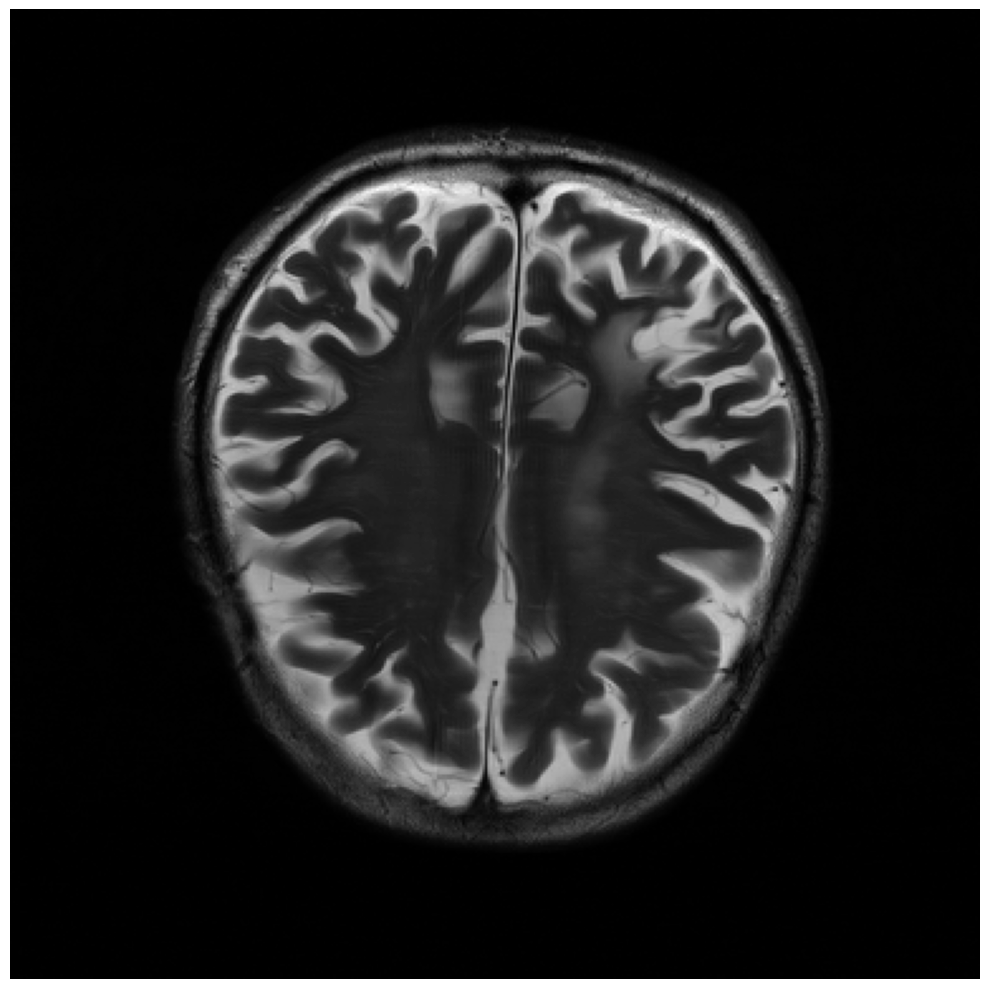

In [306]:
plt.rcParams['figure.figsize'] = [10, 10]
plt.axis('off')
plt.imshow(varnet_slice_reconstruction, cmap='gray')
plt.tight_layout()
plt.savefig("varnet_slice_reconstruction.png")

## U-Net

In [307]:
hf = h5py.File("/home/dbertic/Documents/Faks/OSIRV/data/reconstructed/unet/reconstructions/" + image_name)

In [308]:
print('Keys:', list(hf.keys()))
print('Attrs:', dict(hf.attrs))

Keys: ['reconstruction']
Attrs: {}


We don't have `kspace` key anymore, now we have to use `reconstruction` key.

`Reconstruction` volume has the following shape: (number of slices, height, width).

In [309]:
unet_volume_reconstruction = hf['reconstruction'][()]
print(unet_volume_reconstruction.dtype)
print(unet_volume_reconstruction.shape)

float32
(16, 1, 384, 384)


In [310]:
unet_slice_reconstruction = unet_volume_reconstruction[mri_slice] # Choosing slice
print(unet_volume_reconstruction.shape)

(16, 1, 384, 384)


In [311]:
plt.rcParams['figure.figsize'] = [25, 16] # enlarge inline plots

show_slices(unet_volume_reconstruction.reshape(16, 320, 320), 15, cmap='gray', name="unet_reconstructed_all_slices.png")

ValueError: cannot reshape array of size 2359296 into shape (16,320,320)

Let's show 10th slice.

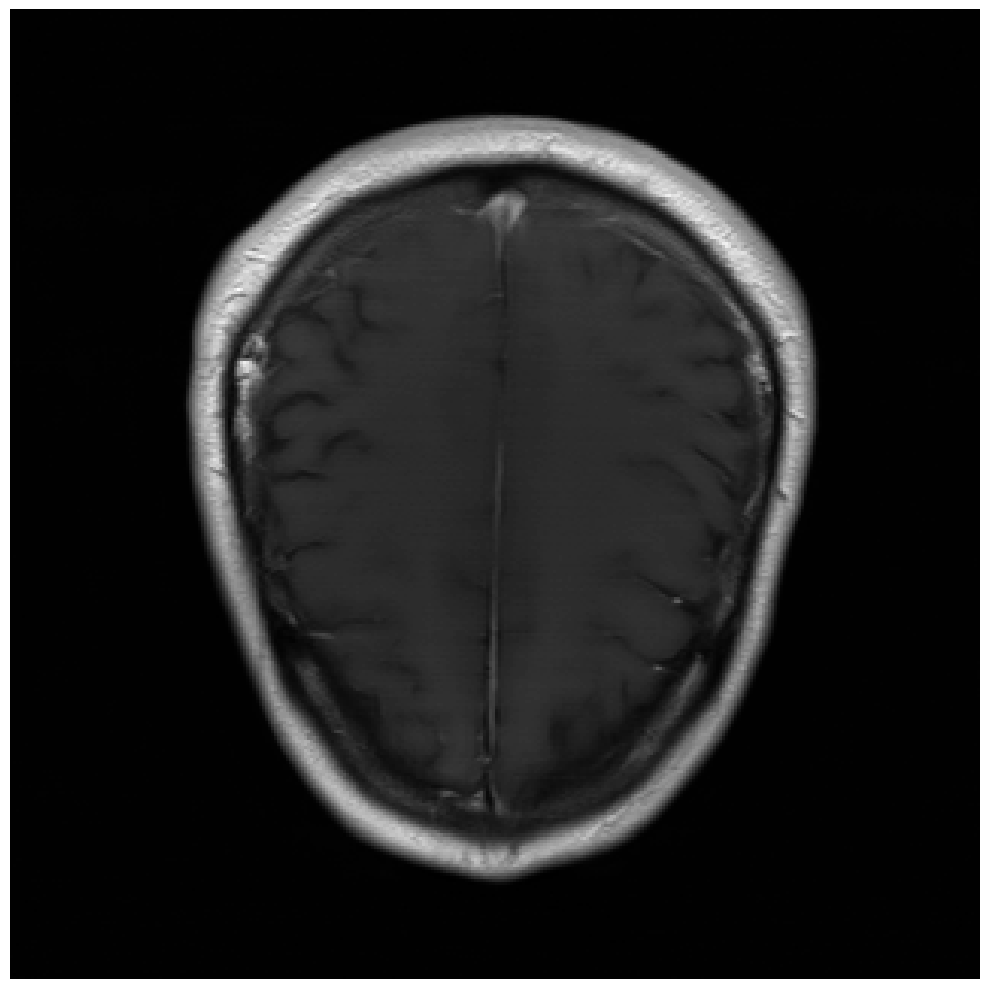

In [ ]:
plt.rcParams['figure.figsize'] = [10, 10]
plt.axis('off')
plt.imshow(unet_slice_reconstruction.reshape(320, 320), cmap='gray')
plt.tight_layout()
plt.savefig("unet_slice_reconstruction.png")